# To process the data into the training data format of BrushNet

In [6]:
import os
from PIL import Image

image_folder = "data/heguan-clothing-styles/images"
image_files = os.listdir(os.path.join(image_folder))
print(len(image_files), image_files[:5])

38084 ['urbanic-af0f01b7e9424ae0b14c14350864b29e.jpg', 'urbanic-6a366ac98b14410094eca5380b9d575c.jpg', 'urbanic-c61abb925dc04645bdf40b353c7a5604.jpg', 'urbanic-3f3c0471c04148fba1267b9a75f92c48.jpg', 'urbanic-9ab451e950f04984b35ee7264ad1cce0.jpg']


In [ ]:
arms_mask_folder = "data/heguan-clothing-styles/inpainting_maskv3/arms_agnostic"
arms_mask_files = os.listdir(os.path.join(arms_mask_folder))
print(len(arms_mask_files), arms_mask_files[:5])

In [ ]:
neck_mask_folder = "data/heguan-clothing-styles/inpainting_maskv3/neck_agnostic"
neck_mask_files = os.listdir(os.path.join(neck_mask_folder))
print(len(neck_mask_files), neck_mask_files[:5])

In [ ]:
length_mask_folder = "data/heguan-clothing-styles/inpainting_maskv3/length_agnostic"
length_mask_files = os.listdir(os.path.join(length_mask_folder))
print(len(length_mask_files), length_mask_files[:5])

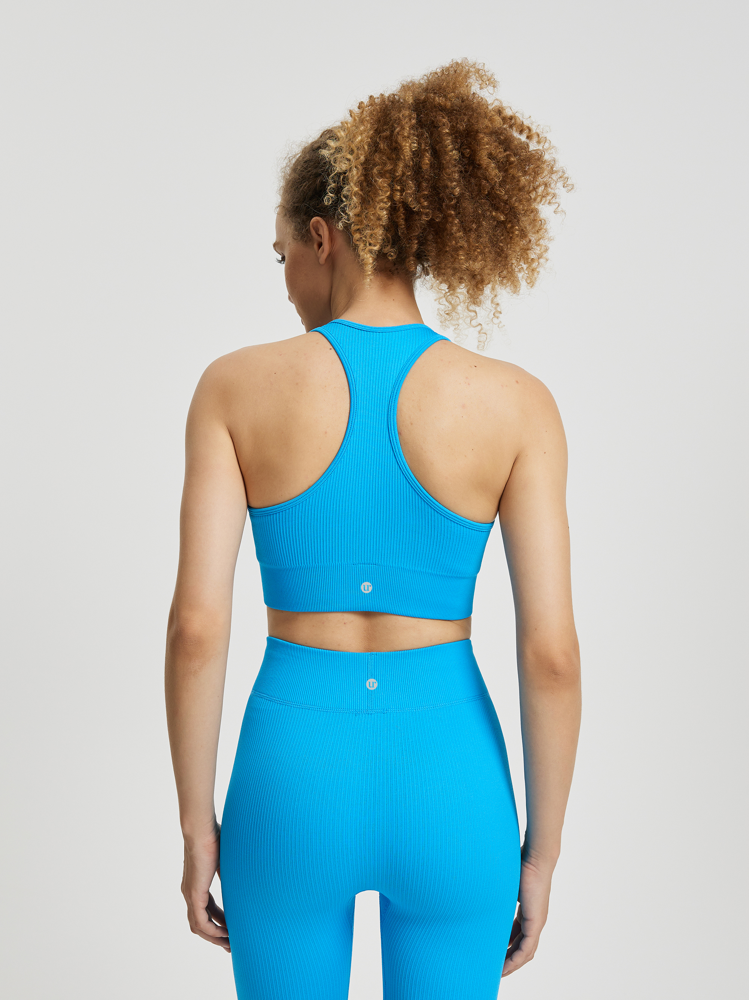

In [10]:
idx = 1
# image_filename = "urbanic-3e97f10081674d08a8edd915bdb97e79.jpg"
# image_filename = "urbanic-c61abb925dc04645bdf40b353c7a5604.jpg"
image_filename = "urbanic-c61abb925dc04645bdf40b353c7a5604.jpg"
image_filename = "urbanic-d1020db594b046fea918e6fd06561781.jpg"
image_filename = "urbanic-d38471f471f847d1816f3e553b62e70e.jpg"

image = Image.open(os.path.join(image_folder, image_filename))

# image = Image.open(os.path.join(image_folder, image_files[idx]))

image

In [11]:
# mask = Image.open(os.path.join(arms_mask_folder, image_files[idx]))
# mask
# mask = Image.open(os.path.join(neck_mask_folder, neck_mask_files[idx]))
# mask
mask = Image.open(os.path.join(length_mask_folder, length_mask_files[idx]))
# mask_filename = os.path.join("data/heguan-clothing-styles/inpainting_maskv3/length", "length-urbanic-3e97f10081674d08a8edd915bdb97e79.jpg")
# mask = Image.open(mask_filename)
mask

NameError: name 'length_mask_folder' is not defined

In [ ]:
import numpy as np

image_array = np.array(image)
mask_array = np.array(mask)
print(f"image shape: {image_array.shape}, mask shape: {mask_array.shape}")

In [ ]:
np.unique(mask_array)

In [ ]:
mask_array_new = 1.*(mask_array>=200)[:,:,np.newaxis]
masked_image_array = image_array * (1-mask_array_new)
masked_image = Image.fromarray(masked_image_array.astype(np.uint8))
masked_image

In [ ]:
# import json

# caption_path = "data/heguan-clothing-styles/urbanic_controlnet.json"

# with open(caption_path, 'r') as fin:
#     captions = json.load(fin)

# captions

In [1]:
import json

# caption_path = "data/heguan-clothing-styles/metadata_with_mask.v3.jsonl"
caption_path = "data/heguan-clothing-styles/metadata_with_mask.jsonl"

captions = []

with open(caption_path, 'r') as fin:
    for line in fin:
        captions.append(json.loads(line))

captions

[{'file_name': 'urbanic-e01e678d03cd417486ac978002409bd8.jpg',
  'text': '(neckline: scoop neck), Drawstring Pullover T-Shirt, style: casual, waistline: , season: summer, main material: polyester, design detail: drawstring, hem shaped: , chest pad: no, belt: , hsn chapters: 61, length: cropped, unit: piece, color: apricot, features: , stretchability: very stretchable, sleeve length: short sleeve, pattern: solid, silhouette: s-line, fitness: slim fit, lining: no, classification: fashion, sleeve type: regular sleeve',
  'mask': 'neck_agnostic/urbanic-e01e678d03cd417486ac978002409bd8.jpg'},
 {'file_name': 'urbanic-3e97f10081674d08a8edd915bdb97e79.jpg',
  'text': '(length: long), Cargo Pocket Trousers, waistline: regular waist, pattern: solid, hem shaped: , hsn chapters: 62, fitness: relaxed fit, sleeve length: , main material: polyester, sleeve type: , silhouette: h-line, season: four seasons, chest pad: , features: , color: black, classification: fashion, stretchability: not stretchable,

In [12]:
filenames = ['urbanic-00038ead34ee4c38b3f2e5d7443b8363.jpg', 'urbanic-00036b2fe7914afda2219c84efe55438.jpg']
filenames = ['urbanic-c61abb925dc04645bdf40b353c7a5604.jpg']
filenames = ['urbanic-d1020db594b046fea918e6fd06561781.jpg']
filenames = ['urbanic-d38471f471f847d1816f3e553b62e70e.jpg']

for entry in captions:
    if entry['file_name'] in filenames:
        print(f"{entry['file_name']}\n{entry['text']}")

urbanic-d38471f471f847d1816f3e553b62e70e.jpg
(neckline: scoop neck), Sports Bra, stretchability: very stretchable, main material: nylon, hsn chapters: 61, pattern: solid, waistline: , color: red, sleeve length: , silhouette: , length: , sleeve type: , style: activewear, unit: piece, classification: basic, chest pad: yes, lining: yes, season: four seasons, hem shaped: , design detail: others, features: seamless, fitness: slim fit, belt: 
urbanic-d38471f471f847d1816f3e553b62e70e.jpg
(neckline: scoop neck), Sports Bra, length: , hsn chapters: 61, chest pad: yes, lining: yes, style: activewear, hem shaped: , stretchability: very stretchable, main material: nylon, season: four seasons, sleeve length: , sleeve type: , belt: , color: red, unit: piece, classification: basic, features: seamless, waistline: , pattern: solid, silhouette: , fitness: slim fit, design detail: others
urbanic-d38471f471f847d1816f3e553b62e70e.jpg
(neckline: scoop neck), Sports Bra, unit: piece, hem shaped: , chest pad:

In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

df_captions = pd.DataFrame(captions)
df_captions.head()

In [ ]:
len(captions)

In [ ]:
df_captions[df_captions['file_name'].str.endswith("urbanic-9ab451e950f04984b35ee7264ad1cce0.jpg")]

In [ ]:
# ref.: https://www.kaggle.com/stainsby/fast-tested-rle
def mask2rle(img):
    """
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formatted
    """
    pixels = img.flatten(order='F')
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    # return ' '.join(str(x) for x in runs)
    return runs.tolist()


def rle2mask(mask_rle: str, label=1, shape=(512, 512)):
    """
    mask_rle: run-length as string formatted (start length)
    shape: (height,width) of array to return
    Returns numpy array, 1 - mask, 0 - background

    """
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = label
    return img.reshape(shape)  # Needed to align to RLE direction


def binarize_mask(mask):
    """
    Convert a NumPy array mask into a binary mask with values 0 and 1.
    1 - mask, 0 - background
    """
    binary_mask = 1.*(mask.sum(-1)>255)[:,:,np.newaxis]
    # print(binary_mask)
    # binary_mask = np.zeros_like(mask, dtype=np.uint8)
    # binary_mask[mask > 200] = 1
    return 1-binary_mask

import random

def handle_caption(text):
    parts = text.split(',')
    
    styles = []
    for part in parts:
        part = part.strip()
        if '(' in part:
            styles.append(part.strip('(').strip(')').strip())
        elif 'color' in part: # ignore wrong colors
            continue
        elif ':' in part:
            kv = part.split(':')
            if len(kv) > 1:
                if kv[1].strip():
                    styles.append(part)
        else:
            styles.append(part)
    
    # random.shuffle(styles)

    return ', '.join(styles)

In [ ]:
import cv2
# import pickle
import webdataset as wds

num = 3

# Define the output dataset directory
output_dir = "data/heguan-reformed/003.tar"

# Create a WebDataset writer
writer = wds.TarWriter(output_dir)

for i, image_file in enumerate(image_files[:num]):
    image_array = cv2.imread(os.path.join(image_folder, image_file))
    
    _, encoded_image = cv2.imencode('.jpg', image_array)
    byte_array = encoded_image.tobytes()
    file_path = f"data/heguan-reformed/{image_file.split('.')[0]}"
    # with open(file_path + ".image", 'wb') as fout:
    #     fout.write(byte_array)
    
    height, width = image_array.shape[0], image_array.shape[1]
    # with open(file_path + ".height", 'wb') as fout:
    #     # pickle.dump(height, fout)
    #     fout.write(str(height).encode())
    
    # with open(file_path + ".width", 'wb') as fout:
    #     # pickle.dump(str(width), fout)
    #     fout.write(str(width).encode())
        
    # print(type(image_array), image_array.shape)
    df_part = df_captions[df_captions['file_name'].str.endswith(image_file)].reset_index(drop=True)
    caption = handle_caption(df_part.loc[0, 'text'])
    # with open(file_path + ".caption", 'wb') as fout:
    #     # pickle.dump(df_part.loc[0, 'prompt'], fout)
    #     fout.write(str(df_part.loc[0, 'prompt']).encode())
        
    # mask
    arms_mask_path = os.path.join(arms_mask_folder, image_file)
    if os.path.exists(arms_mask_path):
        arms_mask_array = cv2.imread(arms_mask_path)
        # mask_array = np.array(mask)
        arms_mask_array_binary = binarize_mask(arms_mask_array)
        arms_mask_rle = mask2rle(arms_mask_array_binary)
    
    neck_mask_path = os.path.join(neck_mask_folder, image_file)
    if os.path.exists(neck_mask_path):
        neck_mask_array = cv2.imread(neck_mask_path)
        # mask_array = np.array(mask)
        neck_mask_array_binary = binarize_mask(neck_mask_array)
        neck_mask_rle = mask2rle(neck_mask_array_binary)
    
    length_mask_path = os.path.join(length_mask_folder, image_file)
    if os.path.exists(length_mask_path):
        length_mask_array = cv2.imread(length_mask_path)
        # mask_array = np.array(mask)
        length_mask_array_binary = binarize_mask(length_mask_array)
        length_mask_rle = mask2rle(length_mask_array_binary)
        
    segmentation = {'mask': [arms_mask_rle, neck_mask_rle, length_mask_rle]}
     
    sample = {
        "__key__": image_file.split('.')[0],
        "width": str(width).encode(),
        "height": str(height).encode(),
        "caption": caption.encode(),
        "image": byte_array,
        "segmentation": json.dumps(segmentation).encode(),
    }
    
    print(sample)
    # Write the sample to the dataset
    writer.write(sample)

# Close the writer
writer.close()

In [ ]:
import tarfile
import os
from collections import defaultdict

def count_distinct_files(folder_path):
    distinct_files = defaultdict(set)
    for filename in os.listdir(folder_path):
        if filename.endswith('.tar'):
            tar_path = os.path.join(folder_path, filename)
            with tarfile.open(tar_path, 'r') as tar:
                for member in tar.getmembers():
                    if member.isfile():
                        file_name = os.path.basename(member.name)
                        file_prefix, _ = os.path.splitext(file_name)
                        distinct_files[file_prefix].add(file_name)
    return len(distinct_files)

folder_path = 'data/heguan-reformed'
num_distinct_files = count_distinct_files(folder_path)
print(f"Total number of distinct files: {num_distinct_files}")

In [ ]:
num_distinct_files * 5